<a href="https://colab.research.google.com/github/raceregos/raceregos/blob/main/AutoEncoderPipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Training autoencoder...
Epoch 1/20, Loss: 0.059631
Epoch 2/20, Loss: 0.008936
Epoch 3/20, Loss: 0.008936
Epoch 4/20, Loss: 0.008936
Epoch 5/20, Loss: 0.008936
Epoch 6/20, Loss: 0.008936
Epoch 7/20, Loss: 0.008936
Epoch 8/20, Loss: 0.008936
Epoch 9/20, Loss: 0.008936
Epoch 10/20, Loss: 0.008936
Epoch 11/20, Loss: 0.008936
Epoch 12/20, Loss: 0.008936
Epoch 13/20, Loss: 0.008936
Epoch 14/20, Loss: 0.008936
Epoch 15/20, Loss: 0.008936
Epoch 16/20, Loss: 0.008936
Epoch 17/20, Loss: 0.008936
Epoch 18/20, Loss: 0.008936
Epoch 19/20, Loss: 0.008936
Epoch 20/20, Loss: 0.008936
Extracting features...
Clustering...
Saved cluster CSV: sonar_latent_clusters.csv
Visualizing...


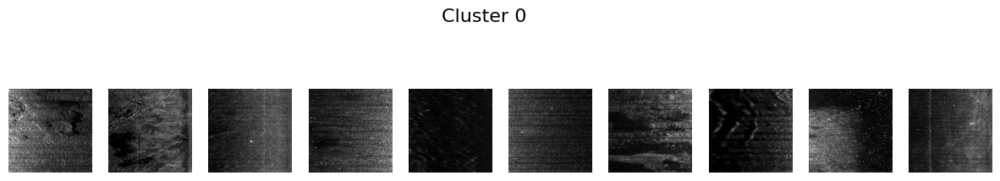

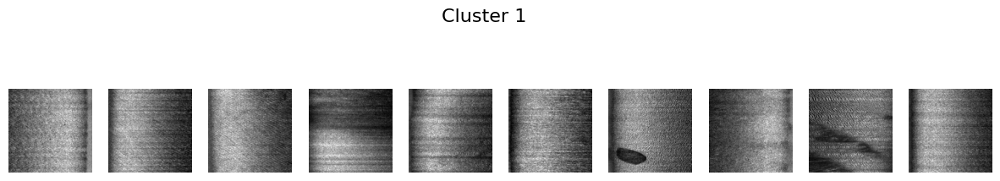

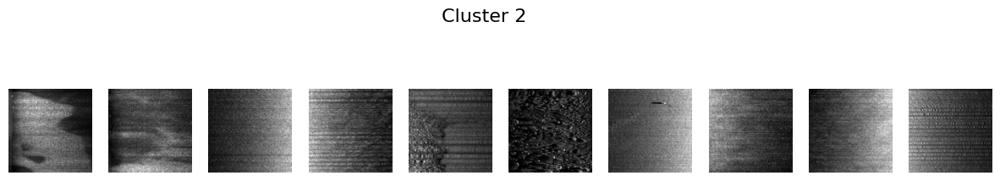

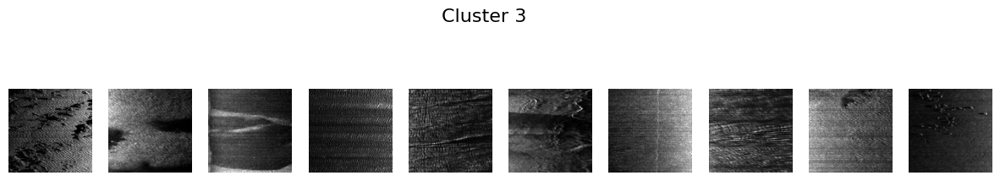

In [1]:
# Autoencoder + KMeans Pipeline for Sonar Image Clustering
# Step-by-step: load images, train autoencoder, extract features, cluster, visualize

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd

# --- Config ---
DATA_DIR = "/content/drive/MyDrive/ssl_dataset"  # Update with your actual folder name
IMAGE_SIZE = (128, 128)
BATCH_SIZE = 32
EPOCHS = 20
LATENT_DIM = 128
N_CLUSTERS = 4
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Dataset ---
class SonarDataset(Dataset):
    def __init__(self, root, transform=None):
        self.filenames = [f for f in os.listdir(root) if f.lower().endswith(('.tif', '.tiff'))]
        self.root = root
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.root, self.filenames[idx])).convert('L')
        if self.transform:
            img = self.transform(img)
        return img, self.filenames[idx]

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
])

dataset = SonarDataset(DATA_DIR, transform=transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# --- Autoencoder ---
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, 3, 2, 1), nn.ReLU(),
            nn.Conv2d(16, 32, 3, 2, 1), nn.ReLU(),
            nn.Conv2d(32, 64, 3, 2, 1), nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * 16 * 16, LATENT_DIM)
        )
        self.decoder = nn.Sequential(
            nn.Linear(LATENT_DIM, 64 * 16 * 16),
            nn.Unflatten(1, (64, 16, 16)),
            nn.ConvTranspose2d(64, 32, 3, 2, 1, 1), nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, 2, 1, 1), nn.ReLU(),
            nn.ConvTranspose2d(16, 1, 3, 2, 1, 1), nn.Sigmoid()
        )

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

model = Autoencoder().to(DEVICE)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# --- Train Autoencoder ---
print("Training autoencoder...")
model.train()
for epoch in range(EPOCHS):
    total_loss = 0
    for imgs, _ in dataloader:
        imgs = imgs.to(DEVICE)
        outputs = model(imgs)
        loss = criterion(outputs, imgs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
    print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {total_loss / len(dataset):.6f}")

# --- Extract Features ---
print("Extracting features...")
model.eval()
features = []
filenames = []
with torch.no_grad():
    for imgs, names in DataLoader(dataset, batch_size=32):
        imgs = imgs.to(DEVICE)
        z = model.encoder(imgs)
        features.append(z.cpu().numpy())
        filenames.extend(names)
features = np.vstack(features)

# --- KMeans Clustering ---
print("Clustering...")
kmeans = KMeans(n_clusters=N_CLUSTERS, n_init=20, random_state=42)
clusters = kmeans.fit_predict(features)

# --- Save CSV ---
df = pd.DataFrame({"filename": filenames, "cluster": clusters})
df.to_csv("/content/sonar_latent_clusters.csv", index=False)
print("Saved cluster CSV: sonar_latent_clusters.csv")

# --- Visualize 10 per Cluster ---
print("Visualizing...")
for c in range(N_CLUSTERS):
    idxs = np.where(clusters == c)[0]
    sample_idxs = np.random.choice(idxs, min(10, len(idxs)), replace=False)
    fig, axes = plt.subplots(1, len(sample_idxs), figsize=(15, 3))
    fig.suptitle(f"Cluster {c}", fontsize=16)
    for i, idx in enumerate(sample_idxs):
        img = Image.open(os.path.join(DATA_DIR, filenames[idx])).convert('L')
        axes[i].imshow(img.resize(IMAGE_SIZE), cmap='gray')
        axes[i].axis('off')
    plt.show()


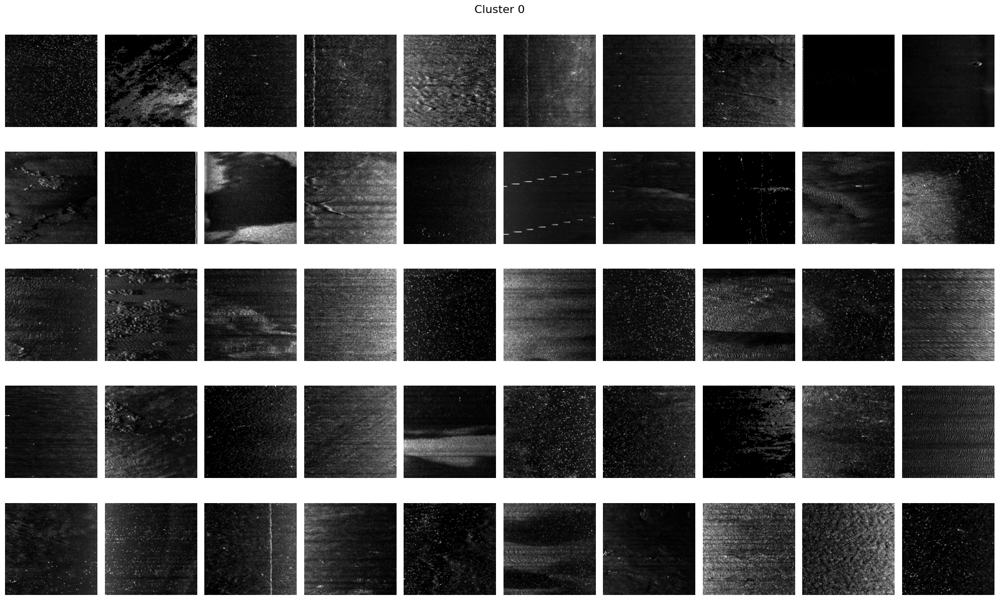

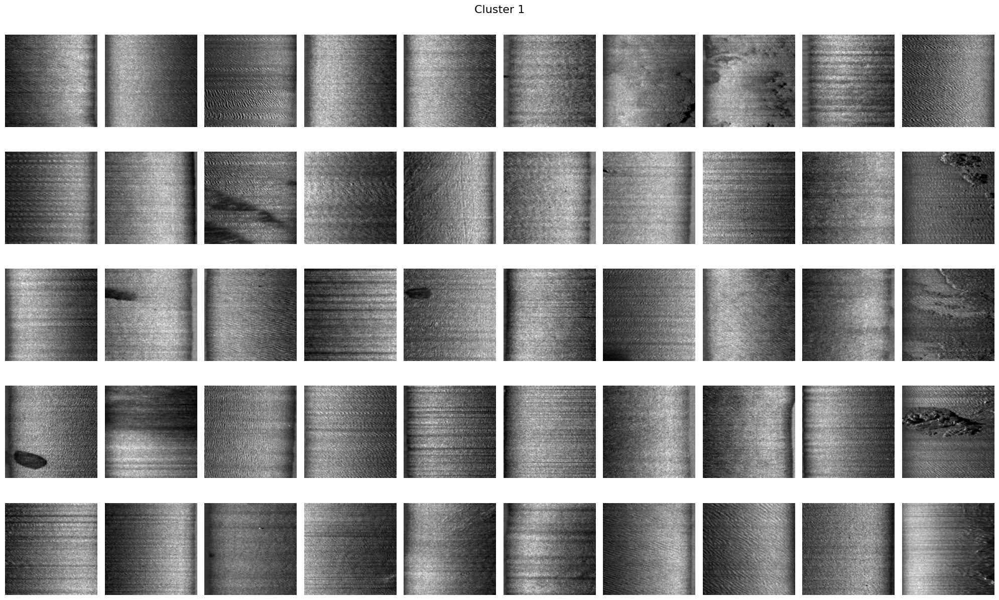

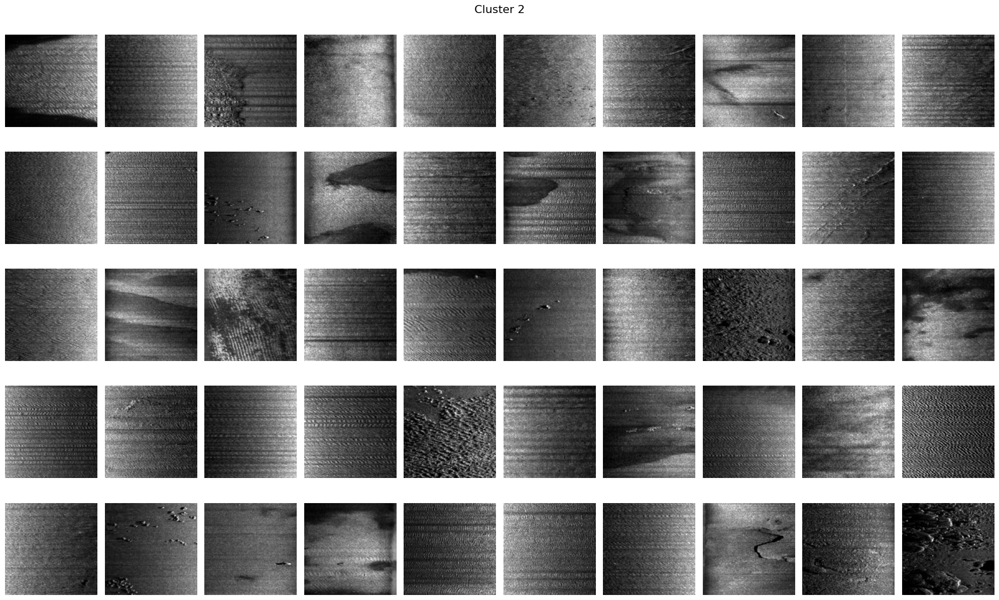

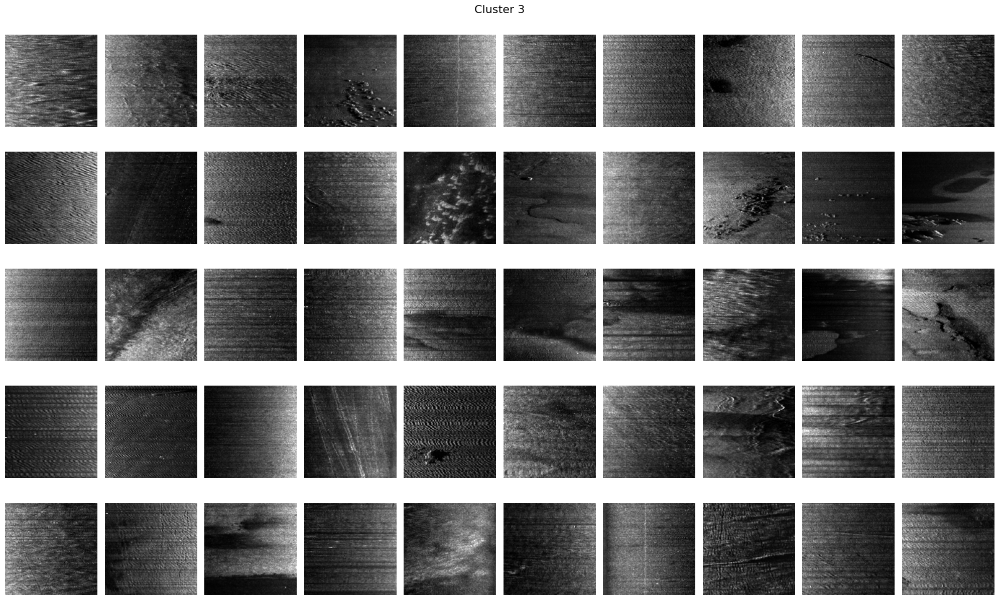

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# --- Config ---
CSV_PATH = '/content/sonar_latent_clusters.csv'
DATA_DIR = '/content/drive/MyDrive/ssl_dataset'  # <-- update this!
IMAGE_SIZE = (128, 128)
SAMPLES_PER_CLUSTER = 50  # <-- increase this as needed

# --- Load CSV ---
df = pd.read_csv(CSV_PATH)
clusters = df['cluster'].unique()

# --- Visualize ---
for c in sorted(clusters):
    cluster_files = df[df['cluster'] == c]['filename'].values
    n = min(SAMPLES_PER_CLUSTER, len(cluster_files))
    sample_files = np.random.choice(cluster_files, n, replace=False)

    rows = (n + 9) // 10  # max 10 images per row
    fig, axes = plt.subplots(rows, 10, figsize=(20, rows * 2.5))
    fig.suptitle(f"Cluster {c}", fontsize=16)

    for i in range(rows * 10):
        r, col = divmod(i, 10)
        ax = axes[r][col] if rows > 1 else axes[col]
        if i < n:
            img_path = os.path.join(DATA_DIR, sample_files[i])
            img = Image.open(img_path).convert('L').resize(IMAGE_SIZE)
            ax.imshow(img, cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.show()
